In [12]:
import os
import pandas as pd
import numpy as np
import pymongo
from pymongo import MongoClient

In [13]:
client = MongoClient('mongodb://10.0.0.56/27017')

In [14]:
db = client.sentdb

In [15]:
collection = db.twittermdata

In [5]:
pipeline = [
    {"$group": {"_id": "$username", "totalLikes": {"$sum": "$likes"}}},
    {"$project": {"_id":0, "username":"$_id", "totalLikes":1}},
    {"$sort": {"totalLikes":-1}},
    {"$limit": 10}
]
aggResult = collection.aggregate(pipeline)
df = pd.DataFrame(list(aggResult))
df

,totalLikes,username
0,652,Zeeshan Siddique
1,450,State Bank of India
2,317,Tata Motors Cars
3,220,Popular Front of India
4,218,PRASHANT RANE
5,173,Baba Siddique
6,149,Samantha Power
7,138,Adani Group
8,127,The Mukul Agrawal
9,125,Jay Bhanushaali (JB)


In [10]:
import plotly.graph_objects as go

In [11]:
fig = go.Figure(data=go.Scatter(y=df['totalLikes'], x=df['username']))
fig.show()

In [36]:
from datetime import datetime
start_Date = datetime(year=int(2020),month=int(7),day=int(1))
end_Date = datetime(year=int(2020),month=int(7),day=int(3))

In [37]:
pipeline = [
    {"$match": {"created": { "$gte": start_Date, "$lte": end_Date}}},
    {"$group": {"_id": "$username", "totalLikes": {"$sum": "$likes"}}},
    {"$project": {"_id":0, "username":"$_id", "totalLikes":1}},
    {"$sort": {"totalLikes":-1}},
    {"$limit": 10}
]
aggResult = collection.aggregate(pipeline)
df = pd.DataFrame(list(aggResult))
df

,totalLikes,username
0,51,Ks💞
1,48,moneycontrol
2,37,Geeta Mohan گیتا موہن गीता मोहन
3,16,CNBC-TV18
4,10,Motilal Oswal Financial Services Ltd
5,10,Garima Kumar
6,10,RASSHMII (Investing is an Art)
7,9,Adani Gas
8,9,Kabir Khan
9,9,Nikhil Gangavane


In [38]:
pipeline = [
    {"$match": {"created": { "$gte": start_Date, "$lte": end_Date}}},
    {"$group": {"_id": "$created", "totalLikes": {"$sum": "$likes"}}},
    {"$project": {"_id":0, "created":"$_id", "totalLikes":1}},
    {"$sort": {"totalLikes":-1}},
    {"$limit": 10}
]
aggResult = collection.aggregate(pipeline)
df = pd.DataFrame(list(aggResult))
df

,totalLikes,created
0,51,2020-07-02 12:53:35
1,48,2020-07-01 17:05:05
2,37,2020-07-01 04:04:27
3,16,2020-07-02 06:21:49
4,10,2020-07-01 05:48:30
5,10,2020-07-01 12:48:31
6,9,2020-07-02 05:42:51
7,9,2020-07-02 09:14:30
8,8,2020-07-02 04:45:36
9,8,2020-07-01 04:10:34


In [39]:
df['new_date'] = [d.date() for d in df['created']]
df['new_time'] = [d.time() for d in df['created']]

In [40]:
del df['created']

In [41]:
df

,totalLikes,new_date,new_time
0,51,2020-07-02,12:53:35
1,48,2020-07-01,17:05:05
2,37,2020-07-01,04:04:27
3,16,2020-07-02,06:21:49
4,10,2020-07-01,05:48:30
5,10,2020-07-01,12:48:31
6,9,2020-07-02,05:42:51
7,9,2020-07-02,09:14:30
8,8,2020-07-02,04:45:36
9,8,2020-07-01,04:10:34


In [42]:
df.groupby(['new_date']).sum()   

,totalLikes
new_date,
2020-07-01,113
2020-07-02,93


In [43]:
aggResult = collection.find({'username': "YES BANK"})
df = pd.DataFrame(list(aggResult))
df = df[['username', 'likes', 'created']]
df['Dates'] = pd.to_datetime(df['created'], format='%Y:%M:%D').dt.date
df['Hours'] = pd.to_datetime(df['created'], format='%Y:%M:%D').dt.time
del df['created']
del df['Hours']
res = df.groupby(['Dates', 'username']).sum()
res.reset_index()
import plotly.graph_objects as go

fig = go.Figure(data=go.Scatter(x=res.reset_index()['Dates'],
                                y=res.reset_index()['likes'],
                                mode='lines+markers',
                                text=res.reset_index()['username'])) # hover text goes here
fig.show()

In [44]:
aggResult = collection.find({"$text": { "$search": "adani"}})
df = pd.DataFrame(list(aggResult))
df = df[['username', 'likes', 'created']]
df['Dates'] = pd.to_datetime(df['created'], format='%Y:%M:%D').dt.date
df['Hours'] = pd.to_datetime(df['created'], format='%Y:%M:%D').dt.time
del df['created']
del df['Hours']
res = df.groupby(['Dates', 'username']).sum()
res.reset_index()
fig = go.Figure(data=go.Scatter(x=res.reset_index()['Dates'],
                                y=res.reset_index()['likes'],
                                mode='lines+markers',
                                text=res.reset_index()['username'])) # hover text goes here
fig.show()

In [45]:
res.reset_index()


,Dates,username,likes
0,2020-06-25,@91,0
1,2020-06-25,Bhupendrasinh Thakor,0
2,2020-06-25,Debabrata,18
3,2020-06-25,Magnum Bull,0
4,2020-06-25,Mayank Singh,0
...,...,...,...
689,2020-08-12,kkonline.org,0
690,2020-08-12,spselva 📈,1
691,2020-08-13,Homaxe,0
692,2021-01-13,D Column Media,0


In [22]:
import plotly.express as px
fig = px.line(res.reset_index(), x='Dates', y='likes', color = 'username')
fig.show()

In [23]:
client = MongoClient('mongodb://10.0.0.56/27017')

In [24]:
db = client.sentdb

In [25]:
collection = db.twittermdata

In [26]:
df1 = pd.DataFrame(list(collection.find()))

In [27]:
df = df1[["username", "likes", "created"]]

In [28]:
df.head()

,username,likes,created
0,Vraj Brahmbhatt,1,2020-07-01 12:22:00
1,Vikas Dilip Salve,0,2020-07-01 12:15:29
2,Dhaval Soni,0,2020-07-01 11:56:35
3,Khwaishkapoor,0,2020-07-01 11:47:43
4,Rahul Chauhan,0,2020-07-01 11:40:05


In [29]:
df = df[df.username.isin(['Dhaval Soni', 'YES BANK', 'State Bank of India'])]

In [30]:
df

,username,likes,created
2,Dhaval Soni,0,2020-07-01 11:56:35
1386,Dhaval Soni,0,2020-07-02 12:27:15
1417,Dhaval Soni,0,2020-07-01 11:56:35
6229,State Bank of India,130,2020-08-11 15:26:28
6301,State Bank of India,245,2020-08-11 09:17:32
6326,State Bank of India,75,2020-08-11 06:07:47
7553,YES BANK,13,2021-01-13 10:45:38
7585,YES BANK,36,2021-01-13 05:31:05
7710,YES BANK,41,2021-01-12 11:25:03


In [31]:
df['Dates'] = pd.to_datetime(df['created'], format='%Y:%M:%D').dt.date
df['Hours'] = pd.to_datetime(df['created'], format='%Y:%M:%D').dt.time
del df['created']
del df['Hours']
res = df.groupby(['Dates', 'username']).sum()
res=res.reset_index()
import plotly.graph_objects as go

fig = go.Figure(data=go.Scatter(x=res.reset_index()['Dates'],
                                y=res.reset_index()['likes'],
                                mode='lines+markers',
                                text=res.reset_index()['username'])) # hover text goes here
fig.show()

In [32]:
import plotly.express as px
fig = px.line(res.reset_index(), x='Dates', y='likes', color = 'username')
fig.show()

In [33]:
a = res.reset_index()

In [34]:
a

,index,Dates,username,likes
0,0,2020-07-01,Dhaval Soni,0
1,1,2020-07-02,Dhaval Soni,0
2,2,2020-08-11,State Bank of India,450
3,3,2021-01-12,YES BANK,41
4,4,2021-01-13,YES BANK,49


In [35]:
import plotly.express as px

fig = px.line(a, x = "Dates", y = "likes", color = "username")
fig.show()

In [80]:
df

,username,likes,created
0,Vraj Brahmbhatt,1,2020-07-01 12:22:00
1,Vikas Dilip Salve,0,2020-07-01 12:15:29
2,Dhaval Soni,0,2020-07-01 11:56:35
3,Khwaishkapoor,0,2020-07-01 11:47:43
4,Rahul Chauhan,0,2020-07-01 11:40:05
...,...,...,...
7794,Khel Shel,0,2021-01-14 08:05:24
7795,khalil khan 🇮🇳,0,2021-01-14 08:05:07
7796,MrCaveMan8588,0,2021-01-14 08:05:04
7797,Pune Devils,0,2021-01-14 08:04:01


In [81]:
df = df1[["username", "likes", "created"]]

In [82]:
a = df[df['username'].str.contains('Stop Adani')]

In [83]:
a

,username,likes,created
209,Stop Adani,31,2020-06-30 04:48:13


In [84]:
b = df1[['username', 'tweets', 'created']]

In [85]:
b

,username,tweets,created
0,Vraj Brahmbhatt,@slayshaaaa @Adani_Elec_Mum @AdaniOnline @Mumb...,2020-07-01 12:22:00
1,Vikas Dilip Salve,@Adani_Elec_Mum @Adani_Elec_Mum @AdaniOnline ...,2020-07-01 12:15:29
2,Dhaval Soni,Adani Gas Bill for Lockdown period is the same...,2020-07-01 11:56:35
3,Khwaishkapoor,So cutting down on electricity consumption was...,2020-07-01 11:47:43
4,Rahul Chauhan,@Adani_Elec_Mum @AdaniOnline paid march and ap...,2020-07-01 11:40:05
...,...,...,...
7794,Khel Shel,According to @iamAhmadshahzad stats in #HBLPSL...,2021-01-14 08:05:24
7795,khalil khan 🇮🇳,RT @sreesanth36: Now that’s what we can call.....,2021-01-14 08:05:07
7796,MrCaveMan8588,Bought a Samsung Galaxy AO1 but stupid #cricke...,2021-01-14 08:05:04
7797,Pune Devils,🌺 Welcoming aboard Adidas as our 🏵️ Official ...,2021-01-14 08:04:01


In [86]:
b = b.reset_index()

In [87]:
b = b[b['tweets'].str.contains('Samsung')]

In [88]:
b

,index,username,tweets,created
6307,6307,Kshitij Rathore,Yesterday I purchased Samsung galaxy A71s by #...,2020-08-11 08:05:16
7796,7796,MrCaveMan8588,Bought a Samsung Galaxy AO1 but stupid #cricke...,2021-01-14 08:05:04


In [13]:
from datetime import datetime
start_Date = datetime(year=int(2020),month=int(7),day=int(1))
end_Date = datetime(year=int(2020),month=int(7),day=int(5))

In [14]:
pipeline = [
    {"$match": {"created": { "$gte": start_Date, "$lte": end_Date}}}
]
aggResult = collection.aggregate(pipeline)
df = pd.DataFrame(list(aggResult))
df.head(40)

,_id,searchterm,tweets,sentiment,sentiment_category,created,username,source,likes,retweet,location,tweet_hashtags,mention_users,tweet_id
0,5efc851081917736d7f5acf5,@adanionline,@slayshaaaa @Adani_Elec_Mum @AdaniOnline @Mumb...,0.350000,positive,2020-07-01 12:22:00,Vraj Brahmbhatt,Twitter for iPhone,1,0,"Mumbai, India",no hashtag,no user,NaN
1,5efc851881917736d7f5acf6,@adanionline,@Adani_Elec_Mum @Adani_Elec_Mum @AdaniOnline ...,0.000000,neutral,2020-07-01 12:15:29,Vikas Dilip Salve,Twitter Web App,0,0,Mumbai,no hashtag,no user,NaN
2,5efc852181917736d7f5acf7,@adanionline,Adani Gas Bill for Lockdown period is the same...,0.000000,neutral,2020-07-01 11:56:35,Dhaval Soni,Twitter for iPhone,0,0,Anjar,no hashtag,no user,NaN
3,5efc852681917736d7f5acf8,@adanionline,So cutting down on electricity consumption was...,-0.148889,negative,2020-07-01 11:47:43,Khwaishkapoor,Twitter for Android,0,0,,no hashtag,no user,NaN
4,5efc852881917736d7f5acf9,@adanionline,@Adani_Elec_Mum @AdaniOnline paid march and ap...,0.000000,neutral,2020-07-01 11:40:05,Rahul Chauhan,Twitter for Android,0,0,"मुंबई, भारत",no hashtag,no user,NaN
5,5efc852a81917736d7f5acfa,@adanionline,@Adani_Elec_Mum @AdaniOnline @gautam_adani i h...,0.000000,neutral,2020-07-01 11:34:20,Rahul Chauhan,Twitter for Android,1,0,"मुंबई, भारत",no hashtag,no user,NaN
6,5efc852b81917736d7f5acfb,@adanionline,RT @lostboy_mr_x: @gautam_adani @FortuneFoods ...,0.250000,positive,2020-07-01 11:27:00,Shreya Pathak,Twitter for Android,0,1,"Uttar Pradesh, India",no hashtag,no user,NaN
7,5efc852e81917736d7f5acfc,@adanionline,RT @stopadani: .@AdaniOnline is displacing tho...,0.136364,positive,2020-07-01 11:25:43,GO GREEN,Twitter Web App,0,27,,no hashtag,no user,NaN
8,5efc852f81917736d7f5acfd,@adanionline,Any update on the recent fraud @Adani_Elec_Mum...,0.000000,neutral,2020-07-01 11:24:55,Nitesh Bharati,Twitter for Android,0,0,"Mumbai, India",no hashtag,no user,NaN
9,5efc853081917736d7f5acfe,@adanionline,RT @stopadani: .@AdaniOnline is displacing tho...,0.136364,positive,2020-07-01 11:23:30,Anna - #frack off Santos/Origin,Twitter Web App,0,27,,no hashtag,no user,NaN


In [15]:
df = df[["username", "likes", "created"]]

In [16]:
df['Dates'] = pd.to_datetime(df['created'], format='%Y:%M:%D').dt.date
df['Hours'] = pd.to_datetime(df['created'], format='%Y:%M:%D').dt.time
del df['created']
del df['Hours']
res = df.groupby(['Dates', 'username']).sum()
df =res.reset_index()


In [17]:
import plotly.express as px
fig = px.line(df, x='Dates', y='likes', color = 'username')
fig.show()

In [18]:
fig = px.scatter(df, x='Dates', y='likes', color = 'username')
fig.show()

In [137]:
df = df[df.username.isin(['Abhijit Ankalkote', '◆SIDDHARTHA BHARDWAJ◆', 'Comms4Climate'])]

In [138]:
df

,Dates,username,likes
1,2020-07-01,Abhijit Ankalkote,1
14,2020-07-01,Comms4Climate,3
104,2020-07-01,◆SIDDHARTHA BHARDWAJ◆,2


In [142]:
res = df.groupby(['Dates', 'username']).sum()
df =res.reset_index()


In [143]:
import plotly.express as px
fig = px.line(df, x='Dates', y='likes', color = 'username')
fig.show()

In [19]:
from datetime import datetime
start_Date = datetime(year=int(2020),month=int(6),day=int(1))
end_Date = datetime(year=int(2020),month=int(7),day=int(5))

In [20]:
pipeline = [
    {"$match": {"created": { "$gte": start_Date, "$lte": end_Date}}}
]
aggResult = collection.aggregate(pipeline)
df = pd.DataFrame(list(aggResult))
df

,_id,searchterm,tweets,sentiment,sentiment_category,created,username,source,likes,retweet,location,tweet_hashtags,mention_users,tweet_id
0,5efc851081917736d7f5acf5,@adanionline,@slayshaaaa @Adani_Elec_Mum @AdaniOnline @Mumb...,0.350000,positive,2020-07-01 12:22:00,Vraj Brahmbhatt,Twitter for iPhone,1,0,"Mumbai, India",no hashtag,no user,NaN
1,5efc851881917736d7f5acf6,@adanionline,@Adani_Elec_Mum @Adani_Elec_Mum @AdaniOnline ...,0.000000,neutral,2020-07-01 12:15:29,Vikas Dilip Salve,Twitter Web App,0,0,Mumbai,no hashtag,no user,NaN
2,5efc852181917736d7f5acf7,@adanionline,Adani Gas Bill for Lockdown period is the same...,0.000000,neutral,2020-07-01 11:56:35,Dhaval Soni,Twitter for iPhone,0,0,Anjar,no hashtag,no user,NaN
3,5efc852681917736d7f5acf8,@adanionline,So cutting down on electricity consumption was...,-0.148889,negative,2020-07-01 11:47:43,Khwaishkapoor,Twitter for Android,0,0,,no hashtag,no user,NaN
4,5efc852881917736d7f5acf9,@adanionline,@Adani_Elec_Mum @AdaniOnline paid march and ap...,0.000000,neutral,2020-07-01 11:40:05,Rahul Chauhan,Twitter for Android,0,0,"मुंबई, भारत",no hashtag,no user,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1637,5f086d2ad2a0255853bfb954,adani trans,RT @stopadani: WIN! After just ruling out Adan...,0.400000,positive,2020-07-01 23:48:47,D'Arcy Mayo,Twitter for iPad,0,49,"Sydney, Australia",no hashtag,no user,1.278476e+18
1638,5f086d2bd2a0255853bfb955,adani trans,RT @stopadani: WIN! After just ruling out Adan...,0.400000,positive,2020-07-01 23:36:47,Geoff Law,Twitter Web App,0,49,Hobart,no hashtag,no user,1.278473e+18
1639,5f086d2cd2a0255853bfb956,adani trans,RT @stopadani: WIN! After just ruling out Adan...,0.400000,positive,2020-07-01 22:18:35,Ken z,Twitter for iPad,0,49,,no hashtag,no user,1.278453e+18
1640,5f086d2ed2a0255853bfb957,adani trans,RT @stopadani: WIN! After just ruling out Adan...,0.400000,positive,2020-07-01 21:25:52,💧 Vivian Harris (⧖),Twitter for iPad,0,49,Bigga (Bega) Australia,no hashtag,no user,1.278440e+18


In [21]:
df = df[df['tweets'].str.contains('Adani_Elec_Mum')]

In [22]:
df = df[["username", "likes", "created"]]

In [23]:
df['Dates'] = pd.to_datetime(df['created'], format='%Y:%M:%D').dt.date
df['Hours'] = pd.to_datetime(df['created'], format='%Y:%M:%D').dt.time
del df['created']
del df['Hours']
res = df.groupby(['Dates', 'username']).sum()
df =res.reset_index()


In [24]:
import plotly.express as px
fig = px.line(df, x='Dates', y='likes', color = 'username')
fig.show()

In [26]:
fig = px.scatter(df, x='Dates', y='likes', color = 'username')
fig.show()

In [27]:
import os
import pandas as pd
import numpy as np
import pymongo
from pymongo import MongoClient
from textblob import TextBlob
import sys
import matplotlib.pyplot as plt

client = MongoClient('mongodb://10.0.0.56/27017')
db = client.sentdb
collection = db.twittermdata

from datetime import datetime
start_Date = datetime(year=int(2020),month=int(6),day=int(1))
end_Date = datetime(year=int(2020),month=int(7),day=int(5))

pipeline = [
    {"$match": {"created": { "$gte": start_Date, "$lte": end_Date}}}
]
aggResult = collection.aggregate(pipeline)
df = pd.DataFrame(list(aggResult))

def percentage(part, whole):
    return 100 * float(part)/float(whole)

searchItem = input("Enter keyword/hashtag to search about: ")
df = df[df['tweets'].str.contains(searchItem)]


Enter keyword/hashtag to search about: this


KeyboardInterrupt: 

In [ ]:
tweets = df['tweets'].to_string(index=False)


In [ ]:
tweets

In [19]:
for tweet in tweets:
    print(tweet.text)

AttributeError: 'str' object has no attribute 'text'

In [1]:
import os
import pandas as pd
import numpy as np
import pymongo
from pymongo import MongoClient
from textblob import TextBlob
import sys
import matplotlib.pyplot as plt

client = MongoClient('mongodb://10.0.0.56/27017')
db = client.sentdb
collection = db.twittermdata

from datetime import datetime
start_Date = datetime(year=int(2020),month=int(6),day=int(1))
end_Date = datetime(year=int(2020),month=int(7),day=int(5))

pipeline = [
    {"$match": {"created": { "$gte": start_Date, "$lte": end_Date}}}
]
aggResult = collection.aggregate(pipeline)
df = pd.DataFrame(list(aggResult))


In [2]:
df = df[df['tweets'].str.contains('Adani')]

In [3]:
df.head()

,_id,searchterm,tweets,sentiment,sentiment_category,created,username,source,likes,retweet,location,tweet_hashtags,mention_users,tweet_id
0,5efc851081917736d7f5acf5,@adanionline,@slayshaaaa @Adani_Elec_Mum @AdaniOnline @Mumb...,0.35,positive,2020-07-01 12:22:00,Vraj Brahmbhatt,Twitter for iPhone,1,0,"Mumbai, India",no hashtag,no user,NaN
1,5efc851881917736d7f5acf6,@adanionline,@Adani_Elec_Mum @Adani_Elec_Mum @AdaniOnline ...,0.00,neutral,2020-07-01 12:15:29,Vikas Dilip Salve,Twitter Web App,0,0,Mumbai,no hashtag,no user,NaN
2,5efc852181917736d7f5acf7,@adanionline,Adani Gas Bill for Lockdown period is the same...,0.00,neutral,2020-07-01 11:56:35,Dhaval Soni,Twitter for iPhone,0,0,Anjar,no hashtag,no user,NaN
4,5efc852881917736d7f5acf9,@adanionline,@Adani_Elec_Mum @AdaniOnline paid march and ap...,0.00,neutral,2020-07-01 11:40:05,Rahul Chauhan,Twitter for Android,0,0,"मुंबई, भारत",no hashtag,no user,NaN
5,5efc852a81917736d7f5acfa,@adanionline,@Adani_Elec_Mum @AdaniOnline @gautam_adani i h...,0.00,neutral,2020-07-01 11:34:20,Rahul Chauhan,Twitter for Android,1,0,"मुंबई, भारत",no hashtag,no user,NaN


In [4]:
import plotly.express as px
fig = px.pie(df, values= 'sentiment', names='sentiment_category', title='Sentiments')
fig.show()

In [5]:
a = df.groupby('sentiment_category')["_id"].count().reset_index(name="count")

In [6]:
fig = px.pie(a, values= 'count', names='sentiment_category', title='Sentiments on Adani')
fig.show()

In [7]:
df

,_id,searchterm,tweets,sentiment,sentiment_category,created,username,source,likes,retweet,location,tweet_hashtags,mention_users,tweet_id
0,5efc851081917736d7f5acf5,@adanionline,@slayshaaaa @Adani_Elec_Mum @AdaniOnline @Mumb...,0.35,positive,2020-07-01 12:22:00,Vraj Brahmbhatt,Twitter for iPhone,1,0,"Mumbai, India",no hashtag,no user,NaN
1,5efc851881917736d7f5acf6,@adanionline,@Adani_Elec_Mum @Adani_Elec_Mum @AdaniOnline ...,0.00,neutral,2020-07-01 12:15:29,Vikas Dilip Salve,Twitter Web App,0,0,Mumbai,no hashtag,no user,NaN
2,5efc852181917736d7f5acf7,@adanionline,Adani Gas Bill for Lockdown period is the same...,0.00,neutral,2020-07-01 11:56:35,Dhaval Soni,Twitter for iPhone,0,0,Anjar,no hashtag,no user,NaN
4,5efc852881917736d7f5acf9,@adanionline,@Adani_Elec_Mum @AdaniOnline paid march and ap...,0.00,neutral,2020-07-01 11:40:05,Rahul Chauhan,Twitter for Android,0,0,"मुंबई, भारत",no hashtag,no user,NaN
5,5efc852a81917736d7f5acfa,@adanionline,@Adani_Elec_Mum @AdaniOnline @gautam_adani i h...,0.00,neutral,2020-07-01 11:34:20,Rahul Chauhan,Twitter for Android,1,0,"मुंबई, भारत",no hashtag,no user,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1637,5f086d2ad2a0255853bfb954,adani trans,RT @stopadani: WIN! After just ruling out Adan...,0.40,positive,2020-07-01 23:48:47,D'Arcy Mayo,Twitter for iPad,0,49,"Sydney, Australia",no hashtag,no user,1.278476e+18
1638,5f086d2bd2a0255853bfb955,adani trans,RT @stopadani: WIN! After just ruling out Adan...,0.40,positive,2020-07-01 23:36:47,Geoff Law,Twitter Web App,0,49,Hobart,no hashtag,no user,1.278473e+18
1639,5f086d2cd2a0255853bfb956,adani trans,RT @stopadani: WIN! After just ruling out Adan...,0.40,positive,2020-07-01 22:18:35,Ken z,Twitter for iPad,0,49,,no hashtag,no user,1.278453e+18
1640,5f086d2ed2a0255853bfb957,adani trans,RT @stopadani: WIN! After just ruling out Adan...,0.40,positive,2020-07-01 21:25:52,💧 Vivian Harris (⧖),Twitter for iPad,0,49,Bigga (Bega) Australia,no hashtag,no user,1.278440e+18


In [8]:
positive = df[df['sentiment_category'] == 'positive']

In [9]:
positive

,_id,searchterm,tweets,sentiment,sentiment_category,created,username,source,likes,retweet,location,tweet_hashtags,mention_users,tweet_id
0,5efc851081917736d7f5acf5,@adanionline,@slayshaaaa @Adani_Elec_Mum @AdaniOnline @Mumb...,0.350000,positive,2020-07-01 12:22:00,Vraj Brahmbhatt,Twitter for iPhone,1,0,"Mumbai, India",no hashtag,no user,NaN
6,5efc852b81917736d7f5acfb,@adanionline,RT @lostboy_mr_x: @gautam_adani @FortuneFoods ...,0.250000,positive,2020-07-01 11:27:00,Shreya Pathak,Twitter for Android,0,1,"Uttar Pradesh, India",no hashtag,no user,NaN
7,5efc852e81917736d7f5acfc,@adanionline,RT @stopadani: .@AdaniOnline is displacing tho...,0.136364,positive,2020-07-01 11:25:43,GO GREEN,Twitter Web App,0,27,,no hashtag,no user,NaN
9,5efc853081917736d7f5acfe,@adanionline,RT @stopadani: .@AdaniOnline is displacing tho...,0.136364,positive,2020-07-01 11:23:30,Anna - #frack off Santos/Origin,Twitter Web App,0,27,,no hashtag,no user,NaN
19,5efc855281917736d7f5ad08,@adanionline,@gautam_adani @FortuneFoods @AdaniOnline Sir I...,0.250000,positive,2020-07-01 10:41:00,◆SIDDHARTHA BHARDWAJ◆,Twitter for Android,2,1,"Allahabad, India",no hashtag,no user,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1637,5f086d2ad2a0255853bfb954,adani trans,RT @stopadani: WIN! After just ruling out Adan...,0.400000,positive,2020-07-01 23:48:47,D'Arcy Mayo,Twitter for iPad,0,49,"Sydney, Australia",no hashtag,no user,1.278476e+18
1638,5f086d2bd2a0255853bfb955,adani trans,RT @stopadani: WIN! After just ruling out Adan...,0.400000,positive,2020-07-01 23:36:47,Geoff Law,Twitter Web App,0,49,Hobart,no hashtag,no user,1.278473e+18
1639,5f086d2cd2a0255853bfb956,adani trans,RT @stopadani: WIN! After just ruling out Adan...,0.400000,positive,2020-07-01 22:18:35,Ken z,Twitter for iPad,0,49,,no hashtag,no user,1.278453e+18
1640,5f086d2ed2a0255853bfb957,adani trans,RT @stopadani: WIN! After just ruling out Adan...,0.400000,positive,2020-07-01 21:25:52,💧 Vivian Harris (⧖),Twitter for iPad,0,49,Bigga (Bega) Australia,no hashtag,no user,1.278440e+18


In [10]:
negative = df[df['sentiment_category'] == 'negative']

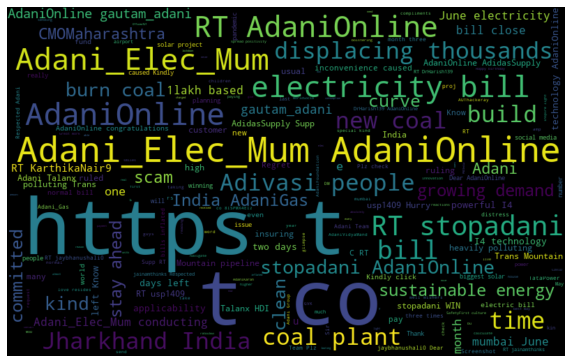

In [11]:
from wordcloud import WordCloud 

normal_words = ' '.join([text for text in df['tweets'][df['sentiment_category']=='positive']])
wordcloud = WordCloud(width=800,height=500,random_state=21,max_font_size=110).generate(normal_words)
plt.figure(figsize=(10,7))
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis("off")
plt.show()

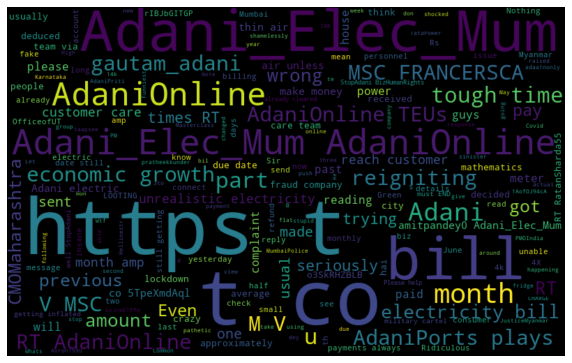

In [12]:
normal_words = ' '.join([text for text in df['tweets'][df['sentiment_category']=='negative']])
wordcloud = WordCloud(width=800,height=500,random_state=21,max_font_size=110).generate(normal_words)
plt.figure(figsize=(10,7))
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis("off")
plt.show()

In [13]:
def remove_pattern(input_text, pattern):
        r = re.findall(pattern, input_text)
        for i in r:
            input_text = re.sub(i, '', input_text)
        return input_text

In [14]:
import re
df['tweets'] = np.vectorize(remove_pattern)(df['tweets'],"@[\w]")
df

,_id,searchterm,tweets,sentiment,sentiment_category,created,username,source,likes,retweet,location,tweet_hashtags,mention_users,tweet_id
0,5efc851081917736d7f5acf5,@adanionline,layshaaaa dani_Elec_Mum daniOnline umbaiPolice...,0.35,positive,2020-07-01 12:22:00,Vraj Brahmbhatt,Twitter for iPhone,1,0,"Mumbai, India",no hashtag,no user,NaN
1,5efc851881917736d7f5acf6,@adanionline,dani_Elec_Mum dani_Elec_Mum daniOnline any up...,0.00,neutral,2020-07-01 12:15:29,Vikas Dilip Salve,Twitter Web App,0,0,Mumbai,no hashtag,no user,NaN
2,5efc852181917736d7f5acf7,@adanionline,Adani Gas Bill for Lockdown period is the same...,0.00,neutral,2020-07-01 11:56:35,Dhaval Soni,Twitter for iPhone,0,0,Anjar,no hashtag,no user,NaN
4,5efc852881917736d7f5acf9,@adanionline,dani_Elec_Mum daniOnline paid march and april ...,0.00,neutral,2020-07-01 11:40:05,Rahul Chauhan,Twitter for Android,0,0,"मुंबई, भारत",no hashtag,no user,NaN
5,5efc852a81917736d7f5acfa,@adanionline,dani_Elec_Mum daniOnline autam_adani i have pa...,0.00,neutral,2020-07-01 11:34:20,Rahul Chauhan,Twitter for Android,1,0,"मुंबई, भारत",no hashtag,no user,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1637,5f086d2ad2a0255853bfb954,adani trans,"RT topadani: WIN! After just ruling out Adani,...",0.40,positive,2020-07-01 23:48:47,D'Arcy Mayo,Twitter for iPad,0,49,"Sydney, Australia",no hashtag,no user,1.278476e+18
1638,5f086d2bd2a0255853bfb955,adani trans,"RT topadani: WIN! After just ruling out Adani,...",0.40,positive,2020-07-01 23:36:47,Geoff Law,Twitter Web App,0,49,Hobart,no hashtag,no user,1.278473e+18
1639,5f086d2cd2a0255853bfb956,adani trans,"RT topadani: WIN! After just ruling out Adani,...",0.40,positive,2020-07-01 22:18:35,Ken z,Twitter for iPad,0,49,,no hashtag,no user,1.278453e+18
1640,5f086d2ed2a0255853bfb957,adani trans,"RT topadani: WIN! After just ruling out Adani,...",0.40,positive,2020-07-01 21:25:52,💧 Vivian Harris (⧖),Twitter for iPad,0,49,Bigga (Bega) Australia,no hashtag,no user,1.278440e+18


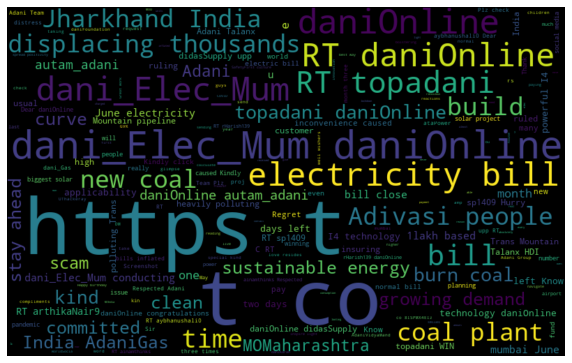

In [15]:
normal_words = ' '.join([text for text in df['tweets'][df['sentiment_category']=='positive']])
wordcloud = WordCloud(width=800,height=500,random_state=21,max_font_size=110).generate(normal_words)
plt.figure(figsize=(10,7))
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis("off")
plt.show()

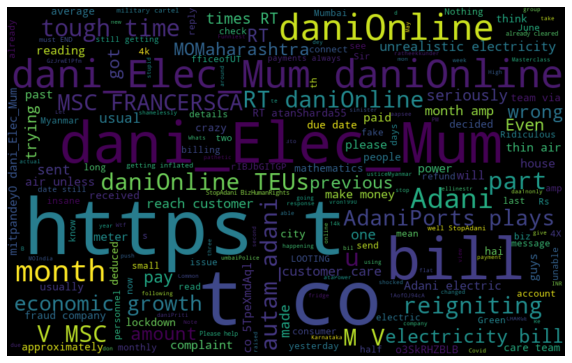

In [16]:
normal_words = ' '.join([text for text in df['tweets'][df['sentiment_category']=='negative']])
wordcloud = WordCloud(width=800,height=500,random_state=21,max_font_size=110).generate(normal_words)
plt.figure(figsize=(10,7))
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis("off")
plt.show()

In [17]:
def hashtag_extract(x):
    hashtags=[]
    for i in x:
        ht = re.findall(r'#(\w+)',i)
        hashtags.append(ht)
    return hashtags

In [18]:
ht_positive = hashtag_extract(df['tweets'][df['sentiment_category']=='positive'])
ht_negative = hashtag_extract(df['tweets'][df['sentiment_category']=='negative'])
ht_positive = sum(ht_positive,[])
ht_negative = sum(ht_negative,[])

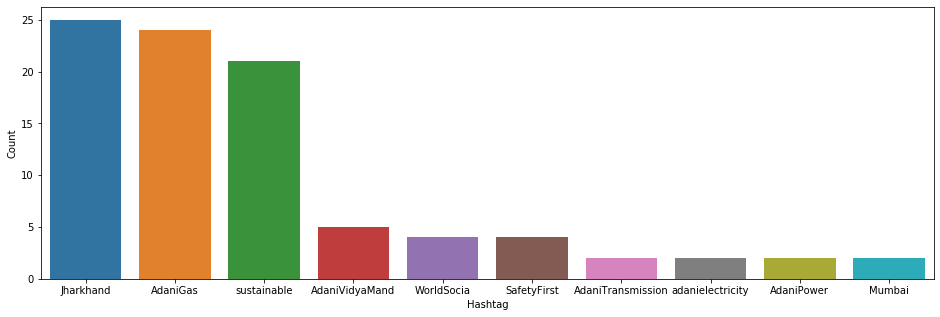

In [19]:
import nltk
import seaborn as sns
positive_ht_tweets = nltk.FreqDist(ht_positive)
df1 = pd.DataFrame({'Hashtag': list(positive_ht_tweets.keys()),'Count':list(positive_ht_tweets.values())})

df1 = df1.nlargest(columns='Count', n=10)
plt.figure(figsize=(16,5))
ax=sns.barplot(data=df1, x='Hashtag', y="Count")
ax.set(ylabel = "Count")
plt.show()

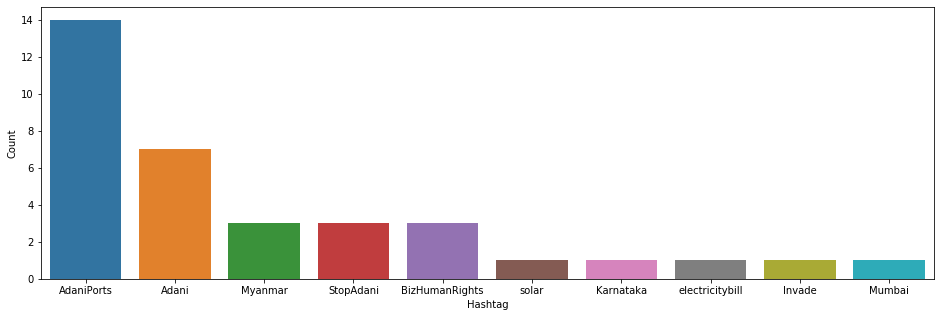

In [20]:
negative_ht_tweets = nltk.FreqDist(ht_negative)
df1 = pd.DataFrame({'Hashtag': list(negative_ht_tweets.keys()),'Count':list(negative_ht_tweets.values())})

df1 = df1.nlargest(columns='Count', n=10)
plt.figure(figsize=(16,5))
ax=sns.barplot(data=df1, x='Hashtag', y="Count")
ax.set(ylabel = "Count")
plt.show()

In [25]:
import os
import pandas as pd
import numpy as np
import pymongo
from pymongo import MongoClient
from textblob import TextBlob
import sys
import matplotlib.pyplot as plt

client = MongoClient('mongodb://10.0.0.56/27017')
db = client.sentdb
collection = db.twittermdata

from datetime import datetime
start_Date = datetime(year=int(2020),month=int(6),day=int(1))
end_Date = datetime(year=int(2020),month=int(7),day=int(5))

pipeline = [
    {"$match": {"created": { "$gte": start_Date, "$lte": end_Date}}}
]
aggResult = collection.aggregate(pipeline)
df = pd.DataFrame(list(aggResult))


In [26]:
df = df[df['tweets'].str.contains('Adani')]

In [27]:
def tag_extract(x):
    tags=[]
    for i in x:
        ht = re.findall('@[\w]*',i)
        tags.append(ht)
    return tags

In [28]:
tag_positive = tag_extract(df['tweets'][df['sentiment_category']=='positive'])
tag_negative = tag_extract(df['tweets'][df['sentiment_category']=='negative'])
tag_positive = sum(tag_positive,[])
tag_negative = sum(tag_negative,[])

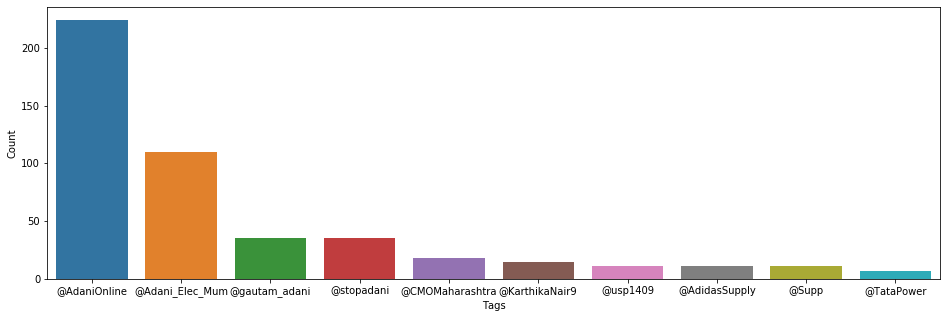

In [29]:
positive_tag_tweets = nltk.FreqDist(tag_positive)
df1 = pd.DataFrame({'Tags': list(positive_tag_tweets.keys()),'Count':list(positive_tag_tweets.values())})

df1 = df1.nlargest(columns='Count', n=10)
plt.figure(figsize=(16,5))
ax=sns.barplot(data=df1, x='Tags', y="Count")
ax.set(ylabel = "Count")
plt.show()

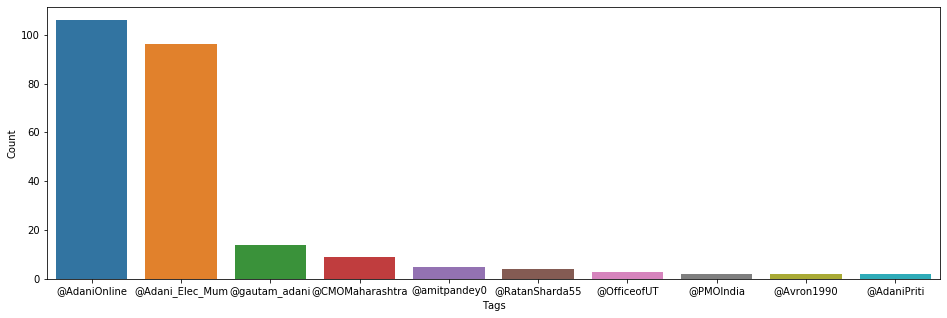

In [30]:
negative_tag_tweets = nltk.FreqDist(tag_negative)
df1 = pd.DataFrame({'Tags': list(negative_tag_tweets.keys()),'Count':list(negative_tag_tweets.values())})

df1 = df1.nlargest(columns='Count', n=10)
plt.figure(figsize=(16,5))
ax=sns.barplot(data=df1, x='Tags', y="Count")
ax.set(ylabel = "Count")
plt.show()

In [6]:
client = MongoClient('10.0.0.56', 27017)
db = client.sentdb
collection = db.twittermdata
aggResult = collection.find({"$text": { "$search": "adani"}})


In [7]:
df = pd.DataFrame(list(aggResult))
df = df[["username", "likes", "created"]]

df['Date'] = pd.to_datetime(df['created'], format='%m/%d/%Y')
df['Hours'] = pd.to_datetime(df['created'], format='%Y:%M:%D').dt.time
del df['created']
del df['Hours']
res = df.groupby(['Date', 'username']).sum()
df =res.reset_index()


In [8]:
df

,Date,username,likes
0,2020-06-25 08:46:40,SpaceMann,0
1,2020-06-25 12:40:00,mirabhayanderkar,0
2,2020-06-25 15:19:14,Mouneera Tejani,0
3,2020-06-25 15:19:26,Mouneera Tejani,0
4,2020-06-25 16:19:25,StockMarket Trendulkar 🇮🇳,2
...,...,...,...
821,2020-08-12 05:13:19,StayHomeStaySafe🇮🇳,0
822,2020-08-12 05:13:30,GoodReturns.IN,0
823,2020-08-13 10:35:25,Homaxe,0
824,2021-01-13 10:50:05,D Column Media,0


In [9]:
df['year'] = pd.DatetimeIndex(df['Date']).year

In [15]:
df.year.dtype

dtype('int64')

In [2]:
client = pymongo.MongoClient('mongodb://10.0.0.56/27017')

In [3]:
database = client['sentdb']

In [4]:
database

Database(MongoClient(host=['10.0.0.56:27017'], document_class=dict, tz_aware=False, connect=True), 'sentdb')

In [7]:
aggResult1 = collection.find({"$text": { "$search": 'adani'}})
df1 = pd.DataFrame(list(aggResult1))
df1

,_id,tweet_id,searchterm,tweets,sentiment,sentiment_category,created,username,source,likes,retweet,location,user_id,tweet_hashtags,mention_users,uid,insert_date
0,5f238d86c196cb1f6ee5a55c,1.288533e+18,#adani,Chart Update :\n\nPerfect move caught on Adani...,0.600000,positive,2020-07-29 17:51:22,IshanJindal,Twitter Web App,0,0,India,1.730807e+08,"[[Adani], [MukeshAmbani, ModiWave], [Adani], [...","[[Jitendra_stock], [], [Bruceneeds2know], [sto...",NaN,NaT
1,5f238d82c196cb1f6ee5a559,1.288712e+18,#adani,RT @udayrajagg: @PMOIndia @LtGovDelhi @EOWDelh...,0.000000,neutral,2020-07-30 05:44:51,Uday Raj Aggarwal,Twitter Web App,0,1,,1.026646e+08,"[[Adani], [MukeshAmbani, ModiWave], [Adani], [...","[[Jitendra_stock], [], [Bruceneeds2know], [sto...",NaN,NaT
2,5f238d83c196cb1f6ee5a55a,1.288615e+18,#adani,Adani Ports and Special Economic Zone Ltd plan...,0.278571,weakly positive,2020-07-29 23:20:26,We For News,TweetDeck,0,0,"New Delhi, Delhi",3.168250e+09,"[[Adani], [MukeshAmbani, ModiWave], [Adani], [...","[[Jitendra_stock], [], [Bruceneeds2know], [sto...",NaN,NaT
3,5f238d85c196cb1f6ee5a55b,1.288601e+18,#adani,@AustralianLabor @QLDLabor this is a fight wor...,0.300000,weakly positive,2020-07-29 22:23:15,Jack Gibbs,Twitter for Android,0,0,,5.004142e+08,"[[Adani], [MukeshAmbani, ModiWave], [Adani], [...","[[Jitendra_stock], [], [Bruceneeds2know], [sto...",NaN,NaT
4,5f238d80c196cb1f6ee5a558,1.288712e+18,#adani,RT @udayrajagg: #adani #fraud #cheat #chor #br...,-0.500000,negative,2020-07-30 05:45:01,Uday Raj Aggarwal,Twitter Web App,0,1,,1.026646e+08,"[[Adani], [MukeshAmbani, ModiWave], [Adani], [...","[[Jitendra_stock], [], [Bruceneeds2know], [sto...",NaN,NaT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
853,5efc891c81917736d7f5af05,NaN,@adanionline,We have long bill from Adani Power .. we don't...,-0.050000,negative,2020-06-28 11:45:17,Our CM is next PM .. jai maharashtra,Twitter for Android,0,0,"Mumbai, India",NaN,no hashtag,no user,NaN,NaT
854,5efc883e81917736d7f5ae8b,NaN,@adanionline,Just check the consumption fraud done by Adani...,0.000000,neutral,2020-06-29 06:25:11,Rizu Kerawala,Twitter for Android,3,1,,NaN,no hashtag,no user,NaN,NaT
855,5efc87f881917736d7f5ae64,NaN,@adanionline,@gautam_adani Adani 2 kaudi ka chor hai tu. Yo...,0.375000,positive,2020-06-29 09:01:26,Ro,Twitter for Android,0,0,"Mumbai, India",NaN,no hashtag,no user,NaN,NaT
856,5fffe2fc3f4fffd04fe27e2b,1.349455e+18,#wipro,"Top Stock to watch out o Jan 14,2021\n\nwipro\...",0.150000,weakly positive,2021-01-13 20:36:00,Swagatika Nandi,Twitter Web App,2,0,Odhisha,1.282600e+18,"[[Infosys, wipro, Q3FY21], [Infosys, wipro, Q3...","[[BeatTheStreet10], [], []]",06a2962c-23e6-59e0-9137-4f42745edb55,NaT


In [8]:
df1['Date'] = pd.to_datetime(df1['created'], format='%m/%d/%Y')
df1['Hours'] = pd.to_datetime(df1['created'], format='%Y:%M:%D').dt.time
df1['year'] = pd.DatetimeIndex(df1['Date']).year
del df1['created']
del df1['Hours']
df =df1.reset_index()
df

,index,_id,tweet_id,searchterm,tweets,sentiment,sentiment_category,username,source,likes,retweet,location,user_id,tweet_hashtags,mention_users,uid,insert_date,Date,year
0,0,5f238d86c196cb1f6ee5a55c,1.288533e+18,#adani,Chart Update :\n\nPerfect move caught on Adani...,0.600000,positive,IshanJindal,Twitter Web App,0,0,India,1.730807e+08,"[[Adani], [MukeshAmbani, ModiWave], [Adani], [...","[[Jitendra_stock], [], [Bruceneeds2know], [sto...",NaN,NaT,2020-07-29 17:51:22,2020
1,1,5f238d82c196cb1f6ee5a559,1.288712e+18,#adani,RT @udayrajagg: @PMOIndia @LtGovDelhi @EOWDelh...,0.000000,neutral,Uday Raj Aggarwal,Twitter Web App,0,1,,1.026646e+08,"[[Adani], [MukeshAmbani, ModiWave], [Adani], [...","[[Jitendra_stock], [], [Bruceneeds2know], [sto...",NaN,NaT,2020-07-30 05:44:51,2020
2,2,5f238d83c196cb1f6ee5a55a,1.288615e+18,#adani,Adani Ports and Special Economic Zone Ltd plan...,0.278571,weakly positive,We For News,TweetDeck,0,0,"New Delhi, Delhi",3.168250e+09,"[[Adani], [MukeshAmbani, ModiWave], [Adani], [...","[[Jitendra_stock], [], [Bruceneeds2know], [sto...",NaN,NaT,2020-07-29 23:20:26,2020
3,3,5f238d85c196cb1f6ee5a55b,1.288601e+18,#adani,@AustralianLabor @QLDLabor this is a fight wor...,0.300000,weakly positive,Jack Gibbs,Twitter for Android,0,0,,5.004142e+08,"[[Adani], [MukeshAmbani, ModiWave], [Adani], [...","[[Jitendra_stock], [], [Bruceneeds2know], [sto...",NaN,NaT,2020-07-29 22:23:15,2020
4,4,5f238d80c196cb1f6ee5a558,1.288712e+18,#adani,RT @udayrajagg: #adani #fraud #cheat #chor #br...,-0.500000,negative,Uday Raj Aggarwal,Twitter Web App,0,1,,1.026646e+08,"[[Adani], [MukeshAmbani, ModiWave], [Adani], [...","[[Jitendra_stock], [], [Bruceneeds2know], [sto...",NaN,NaT,2020-07-30 05:45:01,2020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
853,853,5efc891c81917736d7f5af05,NaN,@adanionline,We have long bill from Adani Power .. we don't...,-0.050000,negative,Our CM is next PM .. jai maharashtra,Twitter for Android,0,0,"Mumbai, India",NaN,no hashtag,no user,NaN,NaT,2020-06-28 11:45:17,2020
854,854,5efc883e81917736d7f5ae8b,NaN,@adanionline,Just check the consumption fraud done by Adani...,0.000000,neutral,Rizu Kerawala,Twitter for Android,3,1,,NaN,no hashtag,no user,NaN,NaT,2020-06-29 06:25:11,2020
855,855,5efc87f881917736d7f5ae64,NaN,@adanionline,@gautam_adani Adani 2 kaudi ka chor hai tu. Yo...,0.375000,positive,Ro,Twitter for Android,0,0,"Mumbai, India",NaN,no hashtag,no user,NaN,NaT,2020-06-29 09:01:26,2020
856,856,5fffe2fc3f4fffd04fe27e2b,1.349455e+18,#wipro,"Top Stock to watch out o Jan 14,2021\n\nwipro\...",0.150000,weakly positive,Swagatika Nandi,Twitter Web App,2,0,Odhisha,1.282600e+18,"[[Infosys, wipro, Q3FY21], [Infosys, wipro, Q3...","[[BeatTheStreet10], [], []]",06a2962c-23e6-59e0-9137-4f42745edb55,NaT,2021-01-13 20:36:00,2021


In [64]:
db = client.social_media

In [65]:
collection = db.tweetstreamdata
collection.find().sort("_id", pymongo.ASCENDING)

In [72]:
aggResult1 = collection.find({"$text": { "$search": 'Tata'}})
df1 = pd.DataFrame(list(aggResult1))
df1

,_id,tweet_id,tweets,full_text,is_retweet,quoted_text,sentiment,sentiment_category,created,username,...,tweet_inseted_date,friends_count,followers_count,statuses_count,user_created,retweet_count,screen_name,search_type,uid,raw
0,605dd017a8e6ab931ae987fa,1375420813319413763,RT @QuranMercy: https://t.co/bSMtMt90fb\n#Rata...,0,False,,1.0,positive,Fri Mar 26 12:14:10 +0000 2021,Quran Guidance for Mankind,...,2021-03-26 08:14:15.874,0,4,383,Thu Oct 29 11:28:28 +0000 2020,0,QuranMercy,stream,d7ed2a7e-347b-4452-9d0f-9fbfcb753553,{'created_at': 'Fri Mar 26 12:14:10 +0000 2021...
1,605dce4ca8e6ab931ae987f8,1375418883801194504,https://t.co/bSMtMt90fb\n#RatanTata what's rea...,https://t.co/bSMtMt90fb\n#RatanTata what's rea...,False,,1.0,positive,Fri Mar 26 12:06:30 +0000 2021,Quran Guidance for Mankind,...,2021-03-26 08:06:36.144,0,4,382,Thu Oct 29 11:28:28 +0000 2020,0,QuranMercy,stream,d7ed2a7e-347b-4452-9d0f-9fbfcb753553,{'created_at': 'Fri Mar 26 12:06:30 +0000 2021...
2,605dd6dfa8e6ab931ae987fb,1375428091141443587,RT @whatpurposehere: #RatanTata Reality of #Li...,0,False,,0.0,neutral,Fri Mar 26 12:43:05 +0000 2021,PurposeOfTheLife,...,2021-03-26 08:43:11.034,0,19,12986,Thu Mar 15 08:24:03 +0000 2018,0,whatpurposehere,stream,d7ed2a7e-347b-4452-9d0f-9fbfcb753553,{'created_at': 'Fri Mar 26 12:43:05 +0000 2021...
3,605daca4a8e6ab931ae987e1,1375382750316822535,Tata means TRUST. \nCongratulations respected ...,Tata means TRUST. \nCongratulations respected ...,False,,0.0,neutral,Fri Mar 26 09:42:55 +0000 2021,Naresh Goud🇮🇳,...,2021-03-26 05:43:00.950,3897,736,5125,Tue Oct 09 15:33:25 +0000 2018,0,iamgoud45,stream,d7ed2a7e-347b-4452-9d0f-9fbfcb753553,{'created_at': 'Fri Mar 26 09:42:55 +0000 2021...
4,605dceeba8e6ab931ae987f9,1375419552574492675,#RatanTata Reality of #LifeHearafter and #Judg...,#RatanTata Reality of #LifeHearafter and #Judg...,False,,0.0,neutral,Fri Mar 26 12:09:10 +0000 2021,PurposeOfTheLife,...,2021-03-26 08:09:15.616,0,19,12979,Thu Mar 15 08:24:03 +0000 2018,0,whatpurposehere,stream,d7ed2a7e-347b-4452-9d0f-9fbfcb753553,{'created_at': 'Fri Mar 26 12:09:10 +0000 2021...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
385,605ec3a3a8e6ab931ae9882c,1375682318845812736,.@TataPower consumers in #Mumbai can soon opt ...,0,False,,-0.2,negative,Sat Mar 27 05:33:18 +0000 2021,ET NOW,...,2021-03-27 01:33:23.645,91,633478,488379,Fri Dec 10 12:49:29 +0000 2010,0,ETNOWlive,stream,d7ed2a7e-347b-4452-9d0f-9fbfcb753553,{'created_at': 'Sat Mar 27 05:33:18 +0000 2021...
386,605cd0a9a8e6ab931ae98759,1375146547176955904,#TataPower\n\nhttps://t.co/dHXCq9nDkP,0,False,,0.0,neutral,Thu Mar 25 18:04:20 +0000 2021,Subi,...,2021-03-25 14:04:25.721,66,334,699,Tue Jun 11 03:07:34 +0000 2013,0,subi_sa,stream,d7ed2a7e-347b-4452-9d0f-9fbfcb753553,{'created_at': 'Thu Mar 25 18:04:20 +0000 2021...
387,605d3293a8e6ab931ae98782,1375251681210900480,"#tatapower DDL, Sun Mobility to set up lithiu...",0,False,,0.0,neutral,Fri Mar 26 01:02:06 +0000 2021,Momentum Trader 🐻 🐂,...,2021-03-25 21:02:11.618,282,572,6693,Sat Jul 13 16:40:25 +0000 2013,0,kumar_invest,stream,d7ed2a7e-347b-4452-9d0f-9fbfcb753553,{'created_at': 'Fri Mar 26 01:02:06 +0000 2021...
388,6063e37a9209cf40142f5631,1377090894600409094,This can be tried in one outskirts area of #Bh...,This can be tried in one outskirts area of #Bh...,False,,0.0,neutral,Wed Mar 31 02:50:29 +0000 2021,Chandrashekhar Mishra,...,2021-03-30 22:50:34.317,1532,320,5499,Mon Jan 06 11:32:53 +0000 2014,0,CSM_Odisha,stream,9247105a-2d8b-4c9c-a77d-18939494b2ed,{'created_at': 'Wed Mar 31 02:50:29 +0000 2021...


In [73]:
df1['Created'] = pd.to_datetime(df1['created'], errors='coerce')

In [74]:
df1

,_id,tweet_id,tweets,full_text,is_retweet,quoted_text,sentiment,sentiment_category,created,username,...,friends_count,followers_count,statuses_count,user_created,retweet_count,screen_name,search_type,uid,raw,Created
0,605dd017a8e6ab931ae987fa,1375420813319413763,RT @QuranMercy: https://t.co/bSMtMt90fb\n#Rata...,0,False,,1.0,positive,Fri Mar 26 12:14:10 +0000 2021,Quran Guidance for Mankind,...,0,4,383,Thu Oct 29 11:28:28 +0000 2020,0,QuranMercy,stream,d7ed2a7e-347b-4452-9d0f-9fbfcb753553,{'created_at': 'Fri Mar 26 12:14:10 +0000 2021...,2021-03-26 12:14:10+00:00
1,605dce4ca8e6ab931ae987f8,1375418883801194504,https://t.co/bSMtMt90fb\n#RatanTata what's rea...,https://t.co/bSMtMt90fb\n#RatanTata what's rea...,False,,1.0,positive,Fri Mar 26 12:06:30 +0000 2021,Quran Guidance for Mankind,...,0,4,382,Thu Oct 29 11:28:28 +0000 2020,0,QuranMercy,stream,d7ed2a7e-347b-4452-9d0f-9fbfcb753553,{'created_at': 'Fri Mar 26 12:06:30 +0000 2021...,2021-03-26 12:06:30+00:00
2,605dd6dfa8e6ab931ae987fb,1375428091141443587,RT @whatpurposehere: #RatanTata Reality of #Li...,0,False,,0.0,neutral,Fri Mar 26 12:43:05 +0000 2021,PurposeOfTheLife,...,0,19,12986,Thu Mar 15 08:24:03 +0000 2018,0,whatpurposehere,stream,d7ed2a7e-347b-4452-9d0f-9fbfcb753553,{'created_at': 'Fri Mar 26 12:43:05 +0000 2021...,2021-03-26 12:43:05+00:00
3,605daca4a8e6ab931ae987e1,1375382750316822535,Tata means TRUST. \nCongratulations respected ...,Tata means TRUST. \nCongratulations respected ...,False,,0.0,neutral,Fri Mar 26 09:42:55 +0000 2021,Naresh Goud🇮🇳,...,3897,736,5125,Tue Oct 09 15:33:25 +0000 2018,0,iamgoud45,stream,d7ed2a7e-347b-4452-9d0f-9fbfcb753553,{'created_at': 'Fri Mar 26 09:42:55 +0000 2021...,2021-03-26 09:42:55+00:00
4,605dceeba8e6ab931ae987f9,1375419552574492675,#RatanTata Reality of #LifeHearafter and #Judg...,#RatanTata Reality of #LifeHearafter and #Judg...,False,,0.0,neutral,Fri Mar 26 12:09:10 +0000 2021,PurposeOfTheLife,...,0,19,12979,Thu Mar 15 08:24:03 +0000 2018,0,whatpurposehere,stream,d7ed2a7e-347b-4452-9d0f-9fbfcb753553,{'created_at': 'Fri Mar 26 12:09:10 +0000 2021...,2021-03-26 12:09:10+00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
385,605ec3a3a8e6ab931ae9882c,1375682318845812736,.@TataPower consumers in #Mumbai can soon opt ...,0,False,,-0.2,negative,Sat Mar 27 05:33:18 +0000 2021,ET NOW,...,91,633478,488379,Fri Dec 10 12:49:29 +0000 2010,0,ETNOWlive,stream,d7ed2a7e-347b-4452-9d0f-9fbfcb753553,{'created_at': 'Sat Mar 27 05:33:18 +0000 2021...,2021-03-27 05:33:18+00:00
386,605cd0a9a8e6ab931ae98759,1375146547176955904,#TataPower\n\nhttps://t.co/dHXCq9nDkP,0,False,,0.0,neutral,Thu Mar 25 18:04:20 +0000 2021,Subi,...,66,334,699,Tue Jun 11 03:07:34 +0000 2013,0,subi_sa,stream,d7ed2a7e-347b-4452-9d0f-9fbfcb753553,{'created_at': 'Thu Mar 25 18:04:20 +0000 2021...,2021-03-25 18:04:20+00:00
387,605d3293a8e6ab931ae98782,1375251681210900480,"#tatapower DDL, Sun Mobility to set up lithiu...",0,False,,0.0,neutral,Fri Mar 26 01:02:06 +0000 2021,Momentum Trader 🐻 🐂,...,282,572,6693,Sat Jul 13 16:40:25 +0000 2013,0,kumar_invest,stream,d7ed2a7e-347b-4452-9d0f-9fbfcb753553,{'created_at': 'Fri Mar 26 01:02:06 +0000 2021...,2021-03-26 01:02:06+00:00
388,6063e37a9209cf40142f5631,1377090894600409094,This can be tried in one outskirts area of #Bh...,This can be tried in one outskirts area of #Bh...,False,,0.0,neutral,Wed Mar 31 02:50:29 +0000 2021,Chandrashekhar Mishra,...,1532,320,5499,Mon Jan 06 11:32:53 +0000 2014,0,CSM_Odisha,stream,9247105a-2d8b-4c9c-a77d-18939494b2ed,{'created_at': 'Wed Mar 31 02:50:29 +0000 2021...,2021-03-31 02:50:29+00:00


In [75]:
df1['Date'] = pd.to_datetime(df1['Created'], format='%m/%d/%Y').dt.date
df1['Hours'] = pd.to_datetime(df1['Created'], format='%Y:%M:%D').dt.time
df1['year'] = pd.DatetimeIndex(df1['Date']).year
del df1['Created']
del df1['Hours']
df =df1.reset_index()
df

,index,_id,tweet_id,tweets,full_text,is_retweet,quoted_text,sentiment,sentiment_category,created,...,followers_count,statuses_count,user_created,retweet_count,screen_name,search_type,uid,raw,Date,year
0,0,605dd017a8e6ab931ae987fa,1375420813319413763,RT @QuranMercy: https://t.co/bSMtMt90fb\n#Rata...,0,False,,1.0,positive,Fri Mar 26 12:14:10 +0000 2021,...,4,383,Thu Oct 29 11:28:28 +0000 2020,0,QuranMercy,stream,d7ed2a7e-347b-4452-9d0f-9fbfcb753553,{'created_at': 'Fri Mar 26 12:14:10 +0000 2021...,2021-03-26,2021
1,1,605dce4ca8e6ab931ae987f8,1375418883801194504,https://t.co/bSMtMt90fb\n#RatanTata what's rea...,https://t.co/bSMtMt90fb\n#RatanTata what's rea...,False,,1.0,positive,Fri Mar 26 12:06:30 +0000 2021,...,4,382,Thu Oct 29 11:28:28 +0000 2020,0,QuranMercy,stream,d7ed2a7e-347b-4452-9d0f-9fbfcb753553,{'created_at': 'Fri Mar 26 12:06:30 +0000 2021...,2021-03-26,2021
2,2,605dd6dfa8e6ab931ae987fb,1375428091141443587,RT @whatpurposehere: #RatanTata Reality of #Li...,0,False,,0.0,neutral,Fri Mar 26 12:43:05 +0000 2021,...,19,12986,Thu Mar 15 08:24:03 +0000 2018,0,whatpurposehere,stream,d7ed2a7e-347b-4452-9d0f-9fbfcb753553,{'created_at': 'Fri Mar 26 12:43:05 +0000 2021...,2021-03-26,2021
3,3,605daca4a8e6ab931ae987e1,1375382750316822535,Tata means TRUST. \nCongratulations respected ...,Tata means TRUST. \nCongratulations respected ...,False,,0.0,neutral,Fri Mar 26 09:42:55 +0000 2021,...,736,5125,Tue Oct 09 15:33:25 +0000 2018,0,iamgoud45,stream,d7ed2a7e-347b-4452-9d0f-9fbfcb753553,{'created_at': 'Fri Mar 26 09:42:55 +0000 2021...,2021-03-26,2021
4,4,605dceeba8e6ab931ae987f9,1375419552574492675,#RatanTata Reality of #LifeHearafter and #Judg...,#RatanTata Reality of #LifeHearafter and #Judg...,False,,0.0,neutral,Fri Mar 26 12:09:10 +0000 2021,...,19,12979,Thu Mar 15 08:24:03 +0000 2018,0,whatpurposehere,stream,d7ed2a7e-347b-4452-9d0f-9fbfcb753553,{'created_at': 'Fri Mar 26 12:09:10 +0000 2021...,2021-03-26,2021
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
385,385,605ec3a3a8e6ab931ae9882c,1375682318845812736,.@TataPower consumers in #Mumbai can soon opt ...,0,False,,-0.2,negative,Sat Mar 27 05:33:18 +0000 2021,...,633478,488379,Fri Dec 10 12:49:29 +0000 2010,0,ETNOWlive,stream,d7ed2a7e-347b-4452-9d0f-9fbfcb753553,{'created_at': 'Sat Mar 27 05:33:18 +0000 2021...,2021-03-27,2021
386,386,605cd0a9a8e6ab931ae98759,1375146547176955904,#TataPower\n\nhttps://t.co/dHXCq9nDkP,0,False,,0.0,neutral,Thu Mar 25 18:04:20 +0000 2021,...,334,699,Tue Jun 11 03:07:34 +0000 2013,0,subi_sa,stream,d7ed2a7e-347b-4452-9d0f-9fbfcb753553,{'created_at': 'Thu Mar 25 18:04:20 +0000 2021...,2021-03-25,2021
387,387,605d3293a8e6ab931ae98782,1375251681210900480,"#tatapower DDL, Sun Mobility to set up lithiu...",0,False,,0.0,neutral,Fri Mar 26 01:02:06 +0000 2021,...,572,6693,Sat Jul 13 16:40:25 +0000 2013,0,kumar_invest,stream,d7ed2a7e-347b-4452-9d0f-9fbfcb753553,{'created_at': 'Fri Mar 26 01:02:06 +0000 2021...,2021-03-26,2021
388,388,6063e37a9209cf40142f5631,1377090894600409094,This can be tried in one outskirts area of #Bh...,This can be tried in one outskirts area of #Bh...,False,,0.0,neutral,Wed Mar 31 02:50:29 +0000 2021,...,320,5499,Mon Jan 06 11:32:53 +0000 2014,0,CSM_Odisha,stream,9247105a-2d8b-4c9c-a77d-18939494b2ed,{'created_at': 'Wed Mar 31 02:50:29 +0000 2021...,2021-03-31,2021


In [76]:
df1

,_id,tweet_id,tweets,full_text,is_retweet,quoted_text,sentiment,sentiment_category,created,username,...,followers_count,statuses_count,user_created,retweet_count,screen_name,search_type,uid,raw,Date,year
0,605dd017a8e6ab931ae987fa,1375420813319413763,RT @QuranMercy: https://t.co/bSMtMt90fb\n#Rata...,0,False,,1.0,positive,Fri Mar 26 12:14:10 +0000 2021,Quran Guidance for Mankind,...,4,383,Thu Oct 29 11:28:28 +0000 2020,0,QuranMercy,stream,d7ed2a7e-347b-4452-9d0f-9fbfcb753553,{'created_at': 'Fri Mar 26 12:14:10 +0000 2021...,2021-03-26,2021
1,605dce4ca8e6ab931ae987f8,1375418883801194504,https://t.co/bSMtMt90fb\n#RatanTata what's rea...,https://t.co/bSMtMt90fb\n#RatanTata what's rea...,False,,1.0,positive,Fri Mar 26 12:06:30 +0000 2021,Quran Guidance for Mankind,...,4,382,Thu Oct 29 11:28:28 +0000 2020,0,QuranMercy,stream,d7ed2a7e-347b-4452-9d0f-9fbfcb753553,{'created_at': 'Fri Mar 26 12:06:30 +0000 2021...,2021-03-26,2021
2,605dd6dfa8e6ab931ae987fb,1375428091141443587,RT @whatpurposehere: #RatanTata Reality of #Li...,0,False,,0.0,neutral,Fri Mar 26 12:43:05 +0000 2021,PurposeOfTheLife,...,19,12986,Thu Mar 15 08:24:03 +0000 2018,0,whatpurposehere,stream,d7ed2a7e-347b-4452-9d0f-9fbfcb753553,{'created_at': 'Fri Mar 26 12:43:05 +0000 2021...,2021-03-26,2021
3,605daca4a8e6ab931ae987e1,1375382750316822535,Tata means TRUST. \nCongratulations respected ...,Tata means TRUST. \nCongratulations respected ...,False,,0.0,neutral,Fri Mar 26 09:42:55 +0000 2021,Naresh Goud🇮🇳,...,736,5125,Tue Oct 09 15:33:25 +0000 2018,0,iamgoud45,stream,d7ed2a7e-347b-4452-9d0f-9fbfcb753553,{'created_at': 'Fri Mar 26 09:42:55 +0000 2021...,2021-03-26,2021
4,605dceeba8e6ab931ae987f9,1375419552574492675,#RatanTata Reality of #LifeHearafter and #Judg...,#RatanTata Reality of #LifeHearafter and #Judg...,False,,0.0,neutral,Fri Mar 26 12:09:10 +0000 2021,PurposeOfTheLife,...,19,12979,Thu Mar 15 08:24:03 +0000 2018,0,whatpurposehere,stream,d7ed2a7e-347b-4452-9d0f-9fbfcb753553,{'created_at': 'Fri Mar 26 12:09:10 +0000 2021...,2021-03-26,2021
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
385,605ec3a3a8e6ab931ae9882c,1375682318845812736,.@TataPower consumers in #Mumbai can soon opt ...,0,False,,-0.2,negative,Sat Mar 27 05:33:18 +0000 2021,ET NOW,...,633478,488379,Fri Dec 10 12:49:29 +0000 2010,0,ETNOWlive,stream,d7ed2a7e-347b-4452-9d0f-9fbfcb753553,{'created_at': 'Sat Mar 27 05:33:18 +0000 2021...,2021-03-27,2021
386,605cd0a9a8e6ab931ae98759,1375146547176955904,#TataPower\n\nhttps://t.co/dHXCq9nDkP,0,False,,0.0,neutral,Thu Mar 25 18:04:20 +0000 2021,Subi,...,334,699,Tue Jun 11 03:07:34 +0000 2013,0,subi_sa,stream,d7ed2a7e-347b-4452-9d0f-9fbfcb753553,{'created_at': 'Thu Mar 25 18:04:20 +0000 2021...,2021-03-25,2021
387,605d3293a8e6ab931ae98782,1375251681210900480,"#tatapower DDL, Sun Mobility to set up lithiu...",0,False,,0.0,neutral,Fri Mar 26 01:02:06 +0000 2021,Momentum Trader 🐻 🐂,...,572,6693,Sat Jul 13 16:40:25 +0000 2013,0,kumar_invest,stream,d7ed2a7e-347b-4452-9d0f-9fbfcb753553,{'created_at': 'Fri Mar 26 01:02:06 +0000 2021...,2021-03-26,2021
388,6063e37a9209cf40142f5631,1377090894600409094,This can be tried in one outskirts area of #Bh...,This can be tried in one outskirts area of #Bh...,False,,0.0,neutral,Wed Mar 31 02:50:29 +0000 2021,Chandrashekhar Mishra,...,320,5499,Mon Jan 06 11:32:53 +0000 2014,0,CSM_Odisha,stream,9247105a-2d8b-4c9c-a77d-18939494b2ed,{'created_at': 'Wed Mar 31 02:50:29 +0000 2021...,2021-03-31,2021
